# Introduction

In [1]:
# import libraries pandas matplotlib and seaborn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

In [2]:
data_path = '/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/data/EXIST2025_training.json'

In [3]:
# Normalize the nested JSON into a DataFrame
df = pd.read_json(data_path).T

print(df.shape)
# Display the DataFrame
df.head()

(2524, 14)


,id_Tiktok,id_EXIST,lang,text,video,path_video,url,annotators,number_annotators,gender_annotators,labels_task3_1,labels_task3_2,labels_task3_3,split
120001,7281385962049998086,120001,es,cuando ves a las del 08 en la fiesta tu amigo...,7281385962049998086.mp4,videos/7281385962049998086.mp4,https://www.tiktok.com/@inazumamemes_/video/72...,"[Annotator_4, Annotator_8, Annotator_9]",3,"[F, M, M]","[YES, NO, YES]","[DIRECT, -, DIRECT]","[[OBJECTIFICATION], [-], [OBJECTIFICATION]]",TRAIN-VIDEO_ES
120002,7164058026352168197,120002,es,mujer sola caminando por la calle | yo automat...,7164058026352168197.mp4,videos/7164058026352168197.mp4,https://www.tiktok.com/@humor_subvencionado/vi...,"[Annotator_4, Annotator_8]",2,"[F, M]","[YES, YES]","[DIRECT, DIRECT]","[[MISOGYNY-NON-SEXUAL-VIOLENCE], [MISOGYNY-NON...",TRAIN-VIDEO_ES
120003,7248606026386263323,120003,es,mi amigo no le importa ni las mujeres ni las ...,7248606026386263323.mp4,videos/7248606026386263323.mp4,https://www.tiktok.com/@basadisimo_3000/video/...,"[Annotator_3, Annotator_7]",2,"[F, M]","[NO, NO]","[-, -]","[[-], [-]]",TRAIN-VIDEO_ES
120004,7305803156074597665,120004,es,confirman las chicas cogiendo confianza despué...,7305803156074597665.mp4,videos/7305803156074597665.mp4,https://www.tiktok.com/@joan_re_07/video/73058...,"[Annotator_3, Annotator_7, Annotator_9]",3,"[F, M, M]","[NO, YES, YES]","[-, DIRECT, DIRECT]","[[-], [STEREOTYPING-DOMINANCE], [STEREOTYPING-...",TRAIN-VIDEO_ES
120005,7318400739775204614,120005,es,aplastar la realidad la gordita del salón tien...,7318400739775204614.mp4,videos/7318400739775204614.mp4,https://www.tiktok.com/@furbito_edits5/video/7...,"[Annotator_3, Annotator_7]",2,"[F, M]","[YES, YES]","[DIRECT, DIRECT]","[[STEREOTYPING-DOMINANCE], [STEREOTYPING-DOMIN...",TRAIN-VIDEO_ES


In [4]:
# Select only the en 
df = df[df['lang'] == 'en']

print(df.shape)
# Display the DataFrame
df.head()

(1000, 14)


,id_Tiktok,id_EXIST,lang,text,video,path_video,url,annotators,number_annotators,gender_annotators,labels_task3_1,labels_task3_2,labels_task3_3,split
220001,6605282293726579974,220001,en,sweetheartkittens hmens. i have died every d...,6605282293726579974.mp4,videos/6605282293726579974.mp4,https://www.tiktok.com/@sweetheartkittens/vide...,"[Annotator_1, Annotator_5]",2,"[F, M]","[NO, NO]","[-, -]","[[-], [-]]",TRAIN-VIDEO_EN
220002,6630477888766348549,220002,en,"stop_sign who won? ok, ali katja glieson 5f...",6630477888766348549.mp4,videos/6630477888766348549.mp4,https://www.tiktok.com/@katjaglieson/video/663...,"[Annotator_1, Annotator_5, Annotator_10]",3,"[F, M, F]","[NO, YES, YES]","[-, DIRECT, JUDGEMENTAL]","[[-], [OBJECTIFICATION], [OBJECTIFICATION]]",TRAIN-VIDEO_EN
220003,6657214348496211205,220003,en,clean the previous detected text by removing ...,6657214348496211205.mp4,videos/6657214348496211205.mp4,https://www.tiktok.com/@stacibird/video/665721...,"[Annotator_2, Annotator_6]",2,"[F, F]","[NO, NO]","[-, -]","[[-], [-]]",TRAIN-VIDEO_EN
220004,6724072000509185286,220004,en,with cleaned text my name is 903 and i am 214...,6724072000509185286.mp4,videos/6724072000509185286.mp4,https://www.tiktok.com/@spazzyy00/video/672407...,"[Annotator_2, Annotator_6]",2,"[F, F]","[NO, NO]","[-, -]","[[-], [-]]",TRAIN-VIDEO_EN
220005,6739312750398409990,220005,en,make her viral clean the detected text by remo...,6739312750398409990.mp4,videos/6739312750398409990.mp4,https://www.tiktok.com/@naliuh/video/673931275...,"[Annotator_2, Annotator_6, Annotator_10]",3,"[F, F, F]","[YES, NO, NO]","[DIRECT, -, -]","[[OBJECTIFICATION], [-], [-]]",TRAIN-VIDEO_EN


In [5]:
# Creating binary label based on majority vote of labels_task3_1

def majority_vote(lst):
    return pd.Series(lst).mode().iloc[0]

df['target'] = df['labels_task3_1'].apply(majority_vote)
df['target'] = df['target'].map({'YES': 1, 'NO': 0})

df.head()

,id_Tiktok,id_EXIST,lang,text,video,path_video,url,annotators,number_annotators,gender_annotators,labels_task3_1,labels_task3_2,labels_task3_3,split,target
220001,6605282293726579974,220001,en,sweetheartkittens hmens. i have died every d...,6605282293726579974.mp4,videos/6605282293726579974.mp4,https://www.tiktok.com/@sweetheartkittens/vide...,"[Annotator_1, Annotator_5]",2,"[F, M]","[NO, NO]","[-, -]","[[-], [-]]",TRAIN-VIDEO_EN,0
220002,6630477888766348549,220002,en,"stop_sign who won? ok, ali katja glieson 5f...",6630477888766348549.mp4,videos/6630477888766348549.mp4,https://www.tiktok.com/@katjaglieson/video/663...,"[Annotator_1, Annotator_5, Annotator_10]",3,"[F, M, F]","[NO, YES, YES]","[-, DIRECT, JUDGEMENTAL]","[[-], [OBJECTIFICATION], [OBJECTIFICATION]]",TRAIN-VIDEO_EN,1
220003,6657214348496211205,220003,en,clean the previous detected text by removing ...,6657214348496211205.mp4,videos/6657214348496211205.mp4,https://www.tiktok.com/@stacibird/video/665721...,"[Annotator_2, Annotator_6]",2,"[F, F]","[NO, NO]","[-, -]","[[-], [-]]",TRAIN-VIDEO_EN,0
220004,6724072000509185286,220004,en,with cleaned text my name is 903 and i am 214...,6724072000509185286.mp4,videos/6724072000509185286.mp4,https://www.tiktok.com/@spazzyy00/video/672407...,"[Annotator_2, Annotator_6]",2,"[F, F]","[NO, NO]","[-, -]","[[-], [-]]",TRAIN-VIDEO_EN,0
220005,6739312750398409990,220005,en,make her viral clean the detected text by remo...,6739312750398409990.mp4,videos/6739312750398409990.mp4,https://www.tiktok.com/@naliuh/video/673931275...,"[Annotator_2, Annotator_6, Annotator_10]",3,"[F, F, F]","[YES, NO, NO]","[DIRECT, -, -]","[[OBJECTIFICATION], [-], [-]]",TRAIN-VIDEO_EN,0


# Train Test Split

In [6]:
# remove the ones with bad videos
bad_vids_df = pd.read_csv("/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/exist2025/bad_videos_log.csv")
bad_vids_df.head()

,filename,error_summary
0,7127737023934369070.mp4,[null @ 0x55555575f3c0] Application provided i...
1,6985683837988752646.mp4,[h264 @ 0x555555678b00] Invalid NAL unit size ...
2,6843540294646893829.mp4,[h264 @ 0x5555556c29c0] Invalid NAL unit size ...
3,6974815706256854278.mp4,[h264 @ 0x5555556ca9c0] Invalid NAL unit size ...
4,7172562634015886597.mp4,[graph -1 input from stream 0:0 @ 0x15553c003d...


In [7]:
clean_df = df[~df['video'].isin(bad_vids_df['filename'])]
clean_df.shape

(973, 15)

In [8]:
df = clean_df

In [9]:
# from sklearn.model_selection import train_test_split

# # train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# # First, split off the test set (20% of total)
# train_valid_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# # Then split the remaining data into train and validation (e.g., 80% train, 20% val from the 80%)
# train_df, valid_df = train_test_split(train_valid_df, test_size=0.25, random_state=42)  # 0.25 * 0.8 = 0.2

# # Final split: 60% train, 20% val, 20% test

In [10]:
# # saving df
# train_df.to_csv("/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/train_test/train_df.csv", index=False)
# valid_df.to_csv("/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/train_test/valid_df.csv", index=False)
# test_df.to_csv("/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/train_test/test_df.csv", index=False)


In [11]:
# load train test
train_df = pd.read_csv("/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/train_test/train_df.csv")
valid_df = pd.read_csv("/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/train_test/valid_df.csv")
test_df = pd.read_csv("/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/train_test/test_df.csv")

In [12]:
print(train_df.shape)
print(valid_df.shape)
print(test_df.shape)

(583, 15)
(195, 15)
(195, 15)


In [13]:
# removing cols

cols_to_rem = ['id_Tiktok','id_EXIST','lang','video','url','annotators',
               'number_annotators','gender_annotators',
               'labels_task3_1','labels_task3_2','labels_task3_3','split']

train_df = train_df.drop(columns=cols_to_rem)
valid_df = valid_df.drop(columns=cols_to_rem)
test_df = test_df.drop(columns=cols_to_rem)

train_df.head()

,text,path_video,target
0,these men stay sparkles pressed sparkles che...,videos/6920327322679692545.mp4,1
1,beaming_face_with_smiling_eyes ‘school’ pent...,videos/6935046770778967302.mp4,1
2,"don’t laugh at your girlfriends choice, you ar...",videos/7123342389338443009.mp4,0
3,i guess she’s not wrong face_with_tears_of_jo...,videos/7076153533996928302.mp4,1
4,"women, why do we do this? woman_facepalming_m...",videos/7039365996053794053.mp4,1


# Extract Audio features using opensmile

In [14]:
import os
from moviepy import VideoFileClip
from tqdm import tqdm

def extract_audio_from_videos(df, video_col='path_video', output_dir='temp_audio'):
    """
    Extract audio (.wav) from video files listed in the DataFrame.
    
    Args:
        df (pd.DataFrame): DataFrame with a column containing video file paths.
        video_col (str): Name of the column in df that contains video paths.
        output_dir (str): Directory to save extracted audio files.

    Returns:
        List of audio file paths (same order as input df)
    """
    os.makedirs(output_dir, exist_ok=True)
    audio_paths = []

    for idx, row in tqdm(df.iterrows(), total=df.shape[0], desc="Processing rows"):
        path = '/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST 2025 Videos Dataset/training/'
        video_subpath = row[video_col]
        video_path = path + video_subpath
        extracted = video_path.split('videos/')[1].replace('.mp4', '')
        audio_path = os.path.join(output_dir, f"{extracted}.wav")

        try:
            clip = VideoFileClip(video_path)
            clip.audio.write_audiofile(audio_path)
            audio_paths.append(audio_path)
        except Exception as e:
            print(f"Error processing {video_path}: {e}")
            audio_paths.append(None)

    return None


In [15]:
# Extract audio files (Run only to convert mp4 to wav)

# audio_path = '/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST 2025 Videos Dataset/training/audio/'
# extract_audio_from_videos(train_df, video_col="path_video", output_dir=audio_path)
# extract_audio_from_videos(test_df, video_col="path_video", output_dir=audio_path)

In [16]:
# Testing audio file
from IPython.display import Audio

# Path to your audio file
audio_path = '/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/training/audio/6851707943579028741.wav'  # Replace with your file path

# Play the audio
Audio(audio_path)

In [17]:
# df_subset = df.head().copy()
# df_subset

In [18]:
import opensmile
import pandas as pd

def extract_mfcc_from_audio(df):
    """
    Extract MFCC features using OpenSMILE from a list of audio paths.

    Args:
        audio_paths (List[str]): List of .wav file paths.

    Returns:
        pd.DataFrame: DataFrame of MFCC features (one row per audio)
    """
    smile = opensmile.Smile(
        feature_set=opensmile.FeatureSet.ComParE_2016,  # Or ComParE_2013, GeMAPSv01b, etc.
        feature_level=opensmile.FeatureLevel.LowLevelDescriptors
    )

    mfcc_features = []
    for idx, row in tqdm(df.iterrows(), total=df.shape[0], desc="Processing rows"):
        
        video_path = row['path_video']
        filename = video_path.split('/')[-1].replace('.mp4', '')
        path = f'/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST 2025 Videos Dataset/training/audio/{filename}.wav'
        
        if path is None:
            mfcc_features.append(pd.Series(dtype=float))
            continue
            print("No path!!!")

        try:
            mfcc = smile.process_file(path)
            mfcc_features.append(mfcc.mean(axis=0))
        except Exception as e:
            print(f"Error extracting MFCC from {path}: {e}")
            mfcc_features.append(pd.Series(dtype=float))

    return pd.DataFrame(mfcc_features)


In [19]:
# # Step 2: Extract MFCC features
# mfcc_df_train = extract_mfcc_from_audio(train_df)
# mfcc_df_test = extract_mfcc_from_audio(test_df)

# # Merge with original
# train_df = pd.concat([train_df.reset_index(drop=True), mfcc_df_train.reset_index(drop=True)], axis=1)
# test_df = pd.concat([test_df.reset_index(drop=True), mfcc_df_test.reset_index(drop=True)], axis=1)


In [20]:
train_df.head()

,text,path_video,target
0,these men stay sparkles pressed sparkles che...,videos/6920327322679692545.mp4,1
1,beaming_face_with_smiling_eyes ‘school’ pent...,videos/6935046770778967302.mp4,1
2,"don’t laugh at your girlfriends choice, you ar...",videos/7123342389338443009.mp4,0
3,i guess she’s not wrong face_with_tears_of_jo...,videos/7076153533996928302.mp4,1
4,"women, why do we do this? woman_facepalming_m...",videos/7039365996053794053.mp4,1


# Frame level

In [21]:
# Base path for audio files
audio_base_path = '/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/training/audio/'


def train_test_paths(df):
    # Convert .mp4 paths to corresponding .wav paths
    df['path_wav'] = df['path_video'].apply(
        lambda x: audio_base_path + os.path.splitext(os.path.basename(x))[0] + '.wav'
    )

    # If you want the list
    audio_paths = df['path_wav'].to_list()
    
    return audio_paths

In [22]:
train_audio_paths = train_test_paths(train_df)
valid_audio_paths = train_test_paths(valid_df)
test_audio_paths = train_test_paths(test_df)

In [23]:
import opensmile
import pandas as pd
import numpy as np
import librosa
from sklearn.preprocessing import StandardScaler
import os
from tqdm import tqdm


def train_test_df(audio_paths):

    # Step 1: Use the Low-Level Descriptors (no summary stats)
    smile = opensmile.Smile(
        feature_set=opensmile.FeatureSet.ComParE_2016,
        feature_level=opensmile.FeatureLevel.LowLevelDescriptors,
    )

    max_frames = 3000  # You can adjust this based on avg duration
    X = []
    mask = []

    for path in tqdm(audio_paths):
        features_df = smile.process_file(path)  # shape: (T, F)

        # Normalize features per file (optional)
        scaler = StandardScaler()
        features_np = scaler.fit_transform(features_df.values)

        # Pad or truncate to max_frames
        if features_np.shape[0] < max_frames:
            padded = np.pad(features_np, ((0, max_frames - features_np.shape[0]), (0, 0)), mode='constant')
            mask.append(np.concatenate([np.ones(features_np.shape[0]), np.zeros(max_frames - features_np.shape[0])]))
        else:
            padded = features_np[:max_frames]
            mask.append(np.ones(max_frames))

        X.append(padded)

    X = np.stack(X)  # Shape: (N, T, F)
    mask = np.stack(mask)  # Optional: for masking later in RNNs
    
    return X


In [24]:
# X_train = train_test_df(train_audio_paths)
# X_valid = train_test_df(valid_audio_paths)
# X_test = train_test_df(test_audio_paths)

# y_train = train_df['target'].values.astype(np.float32)
# y_valid = valid_df['target'].values.astype(np.float32)
# y_test = test_df['target'].values.astype(np.float32)

In [25]:
# print(X_train.shape)
# print(X_valid.shape)
# print(X_test.shape)

In [26]:
import os
import numpy as np

# Define your path
save_dir = "/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/audio_processed_df"

# Make sure the directory exists
# os.makedirs(save_dir, exist_ok=True)

# Save arrays to that directory
# np.save(os.path.join(save_dir, "X_train.npy"), X_train)
# np.save(os.path.join(save_dir, "X_valid.npy"), X_valid)
# np.save(os.path.join(save_dir, "X_test.npy"), X_test)
# np.save(os.path.join(save_dir, "y_train.npy"), y_train)
# np.save(os.path.join(save_dir, "y_valid.npy"), y_valid)
# np.save(os.path.join(save_dir, "y_test.npy"), y_test)

X_train = np.load(os.path.join(save_dir, "X_train.npy"))
X_valid = np.load(os.path.join(save_dir, "X_valid.npy"))
X_test = np.load(os.path.join(save_dir, "X_test.npy"))
y_train = np.load(os.path.join(save_dir, "y_train.npy"))
y_valid = np.load(os.path.join(save_dir, "y_valid.npy"))
y_test = np.load(os.path.join(save_dir, "y_test.npy"))

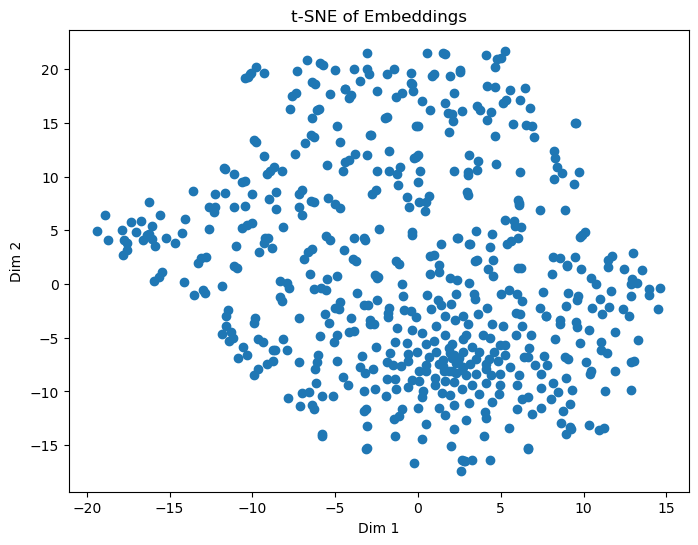

In [27]:
from sklearn.manifold import TSNE

X_train_pooled = X_train.mean(axis=1)
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train_pooled)

plt.figure(figsize=(8,6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
plt.title('t-SNE of Embeddings')
plt.xlabel('Dim 1')
plt.ylabel('Dim 2')
plt.savefig('embeddings_viz.png')
plt.show()
plt.close()





In [28]:
print(X_train.shape)

(583, 3000, 65)


# CNN

In [29]:
import torch
from torch.utils.data import DataLoader, TensorDataset

# # Convert numpy arrays to tensors
# X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
# y_train_tensor = torch.tensor(y_train, dtype=torch.float32)

# X_test_tensor = torch.tensor(X_valid, dtype=torch.float32)
# y_test_tensor = torch.tensor(y_valid, dtype=torch.float32)

# # Datasets and loaders
# train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
# test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

# train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
# test_loader = DataLoader(test_dataset, batch_size=32)


In [30]:
# Convert numpy arrays to tensors
train_features_tensor = torch.tensor(X_train, dtype=torch.float32)
train_labels_tensor = torch.tensor(y_train, dtype=torch.float32)

valid_features_tensor = torch.tensor(X_valid, dtype=torch.float32)
valid_labels_tensor = torch.tensor(y_valid, dtype=torch.float32)

test_features_tensor = torch.tensor(X_test, dtype=torch.float32)
test_labels_tensor = torch.tensor(y_test, dtype=torch.float32)

# Datasets and loaders
train_dataset = TensorDataset(train_features_tensor, train_labels_tensor)
valid_dataset = TensorDataset(valid_features_tensor, valid_labels_tensor)
test_dataset = TensorDataset(test_features_tensor, test_labels_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

# Model Experiments

## AlexNet

In [37]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SexismAudioCNNAlexNet(nn.Module):
    def __init__(self, input_dim, max_frames, conv1_out, dropout, kernel_size, padding):
        super(SexismAudioCNNAlexNet, self).__init__()
        
        self.conv_layers = nn.Sequential(
            nn.Conv1d(in_channels=input_dim, out_channels=conv1_out, kernel_size=kernel_size, stride=4, padding=padding),
            nn.BatchNorm1d(conv1_out),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=3, stride=2),

            nn.Conv1d(conv1_out, 256, kernel_size=5, padding=2),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=3, stride=2),

            nn.Conv1d(256, 384, kernel_size=3, padding=1),
            nn.BatchNorm1d(384),
            nn.ReLU(),

            nn.Conv1d(384, 384, kernel_size=3, padding=1),
            nn.BatchNorm1d(384),
            nn.ReLU(),

            nn.Conv1d(384, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=3, stride=2),

            nn.AdaptiveAvgPool1d(1)
        )

        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 4096),
            nn.ReLU(),
            nn.Dropout(dropout),

            nn.Linear(4096, 4096),
            nn.ReLU(),
            nn.Dropout(dropout),

            nn.Linear(4096, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = x.permute(0, 2, 1)  # (batch_size, channels, time)
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x


In [58]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import f1_score
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming SexismAudioCNNAlexNet is already defined

# Define your device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Example dataset
# You must replace this with your real train_loader and valid_loader
# Dummy loaders for illustration:
train_loader = train_loader
valid_loader = valid_loader

# Define hyperparameter grid
param_grid = {
    'lr': [1e-5, 5e-5, 1e-4, 5e-4, 1e-3],
    'dropout': [0.1, 0.3, 0.4],
    'conv1_out_channels': [32, 64, 128],
    'kernel_size': [2, 3, 5],
    'padding': [0, 1, 2]
}

# param_grid = {
#     'lr': [1e-5, 5e-5, 1e-4],
#     'dropout': [0.1, 0.3, 0.4],
#     'conv1_out_channels': [32, 64],
#     'kernel_size': [2],
#     'padding': [1]
# }

import itertools

# Create all combinations
all_param_combinations = list(itertools.product(
    param_grid['lr'],
    param_grid['dropout'],
    param_grid['conv1_out_channels'],
    param_grid['kernel_size'],
    param_grid['padding']
))

# Results list
results = []

# Total number of trials
total_trials = len(all_param_combinations)

# Grid search loop
for trial_idx, (lr, dropout, conv1_out_channels, kernel_size, padding) in enumerate(all_param_combinations, start=1):
    print(f"\n--- Trial {trial_idx}/{total_trials} ---")
    print(f"Testing: lr={lr}, dropout={dropout}, conv1_out_channels={conv1_out_channels}, kernel_size={kernel_size}, padding={padding}")

    # Initialize the model
    model = SexismAudioCNNAlexNet(
        input_dim=65,  # Replace with your actual input dimension
        max_frames=3000,  # Replace with your actual max_frames
        conv1_out=conv1_out_channels,
        dropout=dropout,
        kernel_size=kernel_size,
        padding=padding
    ).to(device)

    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCELoss()

    # Quick training - Just 1-3 epochs for grid search
    num_epochs = 2
    for epoch in range(num_epochs):
        model.train()
        for batch in train_loader:
            inputs, labels = batch
            inputs, labels = inputs.to(device), labels.to(device).float()

            optimizer.zero_grad()
            outputs = model(inputs).squeeze()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

    # Evaluate
    def evaluate(loader):
        model.eval()
        preds = []
        trues = []
        with torch.no_grad():
            for batch in loader:
                inputs, labels = batch
                inputs, labels = inputs.to(device), labels.to(device).float()
                outputs = model(inputs).squeeze()
                preds.append(outputs.cpu())
                trues.append(labels.cpu())
        preds = torch.cat(preds)
        trues = torch.cat(trues)
        preds_binary = (preds > 0.5).float()
        return f1_score(trues.numpy(), preds_binary.numpy())

    train_f1 = evaluate(train_loader)
    valid_f1 = evaluate(valid_loader)

    # Save results
    results.append({
        'lr': lr,
        'dropout': dropout,
        'conv1_out_channels': conv1_out_channels,
        'kernel_size': kernel_size,
        'padding': padding,
        'train_f1': train_f1,
        'valid_f1': valid_f1
    })

# Convert results into DataFrame
results_df = pd.DataFrame(results)
results_df.to_csv('gridsearch_results.csv', index=False)

print(results_df.head())


--- Trial 1/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=0

--- Trial 2/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=1

--- Trial 3/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=2

--- Trial 4/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=0

--- Trial 5/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=1

--- Trial 6/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=2

--- Trial 7/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=0

--- Trial 8/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=1

--- Trial 9/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=2

--- Trial 10/405 ---
Testing: lr=1e-05, dropout=0.1, conv1_out_channels=64, kernel_size=2,


--- Trial 82/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=0

--- Trial 83/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=1

--- Trial 84/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=2

--- Trial 85/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=0

--- Trial 86/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=1

--- Trial 87/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=2

--- Trial 88/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=0

--- Trial 89/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=1

--- Trial 90/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=2

--- Trial 91/405 ---
Testing: lr=5e-05, dropout=0.1, conv1_out_channels=64, kerne


--- Trial 162/405 ---
Testing: lr=5e-05, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=2

--- Trial 163/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=0

--- Trial 164/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=1

--- Trial 165/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=2

--- Trial 166/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=0

--- Trial 167/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=1

--- Trial 168/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=2

--- Trial 169/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=0

--- Trial 170/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_out_channels=32, kernel_size=5, padding=1

--- Trial 171/405 ---
Testing: lr=0.0001, dropout=0.1, conv1_ou


--- Trial 241/405 ---
Testing: lr=0.0001, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=0

--- Trial 242/405 ---
Testing: lr=0.0001, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=1

--- Trial 243/405 ---
Testing: lr=0.0001, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=2

--- Trial 244/405 ---
Testing: lr=0.0005, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=0

--- Trial 245/405 ---
Testing: lr=0.0005, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=1

--- Trial 246/405 ---
Testing: lr=0.0005, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=2

--- Trial 247/405 ---
Testing: lr=0.0005, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=0

--- Trial 248/405 ---
Testing: lr=0.0005, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=1

--- Trial 249/405 ---
Testing: lr=0.0005, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=2

--- Trial 250/405 ---
Testing: lr=0.0005, dropout=0.1, conv1


--- Trial 320/405 ---
Testing: lr=0.0005, dropout=0.4, conv1_out_channels=128, kernel_size=3, padding=1

--- Trial 321/405 ---
Testing: lr=0.0005, dropout=0.4, conv1_out_channels=128, kernel_size=3, padding=2

--- Trial 322/405 ---
Testing: lr=0.0005, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=0

--- Trial 323/405 ---
Testing: lr=0.0005, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=1

--- Trial 324/405 ---
Testing: lr=0.0005, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=2

--- Trial 325/405 ---
Testing: lr=0.001, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=0

--- Trial 326/405 ---
Testing: lr=0.001, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=1

--- Trial 327/405 ---
Testing: lr=0.001, dropout=0.1, conv1_out_channels=32, kernel_size=2, padding=2

--- Trial 328/405 ---
Testing: lr=0.001, dropout=0.1, conv1_out_channels=32, kernel_size=3, padding=0

--- Trial 329/405 ---
Testing: lr=0.001, dropout=0.1, conv1_ou


--- Trial 400/405 ---
Testing: lr=0.001, dropout=0.4, conv1_out_channels=128, kernel_size=3, padding=0

--- Trial 401/405 ---
Testing: lr=0.001, dropout=0.4, conv1_out_channels=128, kernel_size=3, padding=1

--- Trial 402/405 ---
Testing: lr=0.001, dropout=0.4, conv1_out_channels=128, kernel_size=3, padding=2

--- Trial 403/405 ---
Testing: lr=0.001, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=0

--- Trial 404/405 ---
Testing: lr=0.001, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=1

--- Trial 405/405 ---
Testing: lr=0.001, dropout=0.4, conv1_out_channels=128, kernel_size=5, padding=2
        lr  dropout  conv1_out_channels  kernel_size  padding  train_f1  \
0  0.00001      0.1                  32            2        0  0.396825   
1  0.00001      0.1                  32            2        1  0.412935   
2  0.00001      0.1                  32            2        2  0.522267   
3  0.00001      0.1                  32            3        0  0.044776   
4

In [62]:
# Sort by validation F1 score descending
sorted_results = results_df.sort_values(by='valid_f1', ascending=False)

# Display the top results
sorted_results.head())

# Best params
best_params = sorted_results.iloc[0]
print("\nBest Hyperparameters:")
print(best_params)


          lr  dropout  conv1_out_channels  kernel_size  padding  train_f1  \
281  0.00050      0.3                  64            2        2  0.620118   
392  0.00100      0.4                  64            3        2  0.608808   
306  0.00050      0.4                  64            2        0  0.570997   
108  0.00005      0.3                  32            2        0  0.564263   
350  0.00100      0.1                 128            5        2  0.580357   

     valid_f1  
281  0.602151  
392  0.581673  
306  0.543779  
108  0.536585  
350  0.532110  

Best Hyperparameters:
lr                     0.000500
dropout                0.300000
conv1_out_channels    64.000000
kernel_size            2.000000
padding                2.000000
train_f1               0.620118
valid_f1               0.602151
Name: 281, dtype: float64


          dropout  conv1_out_channels  kernel_size  padding  train_f1  \
lr                                                                      
0.00001  0.266667           74.666667     3.333333      1.0  0.241516   
0.00005  0.266667           74.666667     3.333333      1.0  0.353719   
0.00010  0.266667           74.666667     3.333333      1.0  0.350093   
0.00050  0.266667           74.666667     3.333333      1.0  0.369364   
0.00100  0.266667           74.666667     3.333333      1.0  0.272534   

         valid_f1  
lr                 
0.00001  0.154849  
0.00005  0.237302  
0.00010  0.225737  
0.00050  0.269840  
0.00100  0.213615  


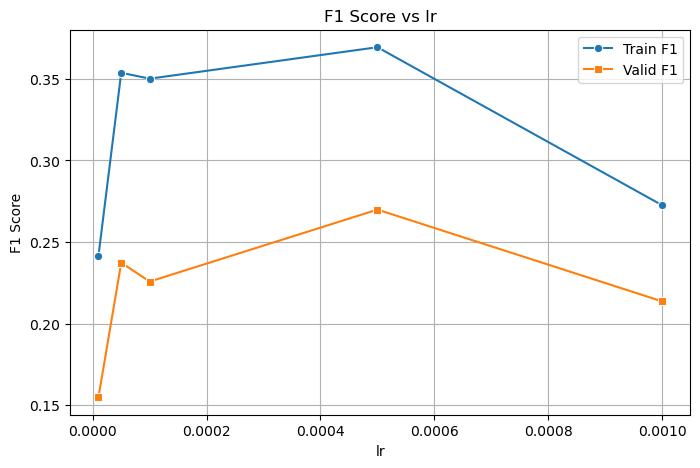

               lr  conv1_out_channels  kernel_size  padding  train_f1  \
dropout                                                                 
0.1      0.000332           74.666667     3.333333      1.0  0.342359   
0.3      0.000332           74.666667     3.333333      1.0  0.307053   
0.4      0.000332           74.666667     3.333333      1.0  0.302923   

         valid_f1  
dropout            
0.1      0.237817  
0.3      0.211214  
0.4      0.211774  


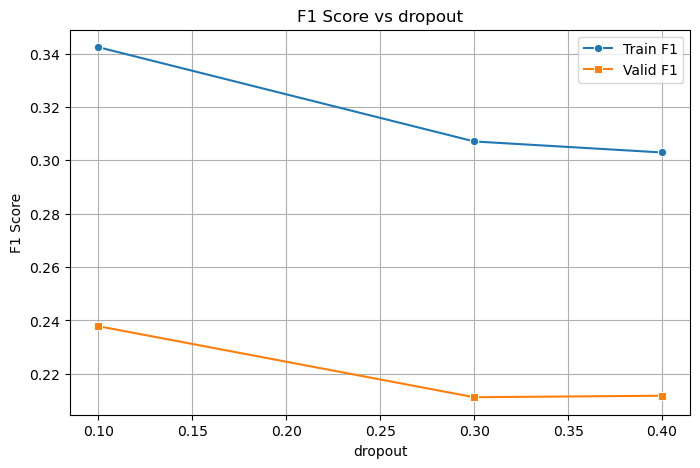

                          lr   dropout  kernel_size  padding  train_f1  \
conv1_out_channels                                                       
32                  0.000332  0.266667     3.333333      1.0  0.312677   
64                  0.000332  0.266667     3.333333      1.0  0.315804   
128                 0.000332  0.266667     3.333333      1.0  0.323856   

                    valid_f1  
conv1_out_channels            
32                  0.217077  
64                  0.218545  
128                 0.225183  


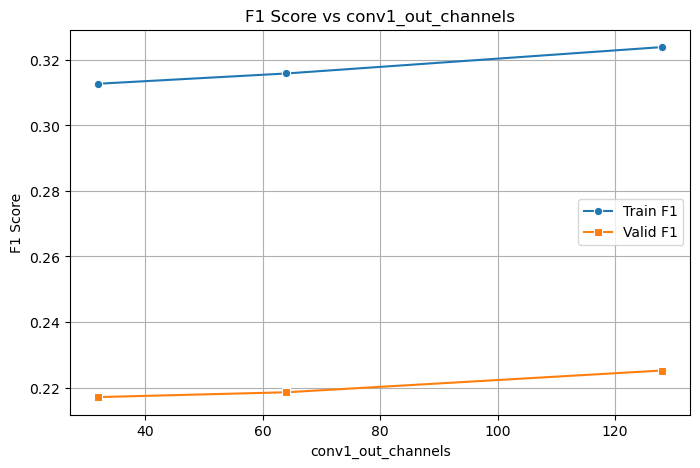

                   lr   dropout  conv1_out_channels  padding  train_f1  \
kernel_size                                                              
2            0.000332  0.266667           74.666667      1.0  0.352404   
3            0.000332  0.266667           74.666667      1.0  0.298287   
5            0.000332  0.266667           74.666667      1.0  0.301645   

             valid_f1  
kernel_size            
2            0.248228  
3            0.200931  
5            0.211645  


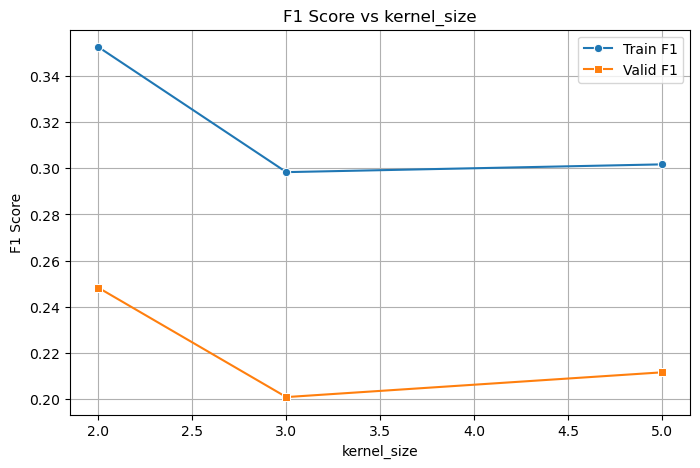

               lr   dropout  conv1_out_channels  kernel_size  train_f1  \
padding                                                                  
0        0.000332  0.266667           74.666667     3.333333  0.327427   
1        0.000332  0.266667           74.666667     3.333333  0.306226   
2        0.000332  0.266667           74.666667     3.333333  0.318684   

         valid_f1  
padding            
0        0.230142  
1        0.210511  
2        0.220152  


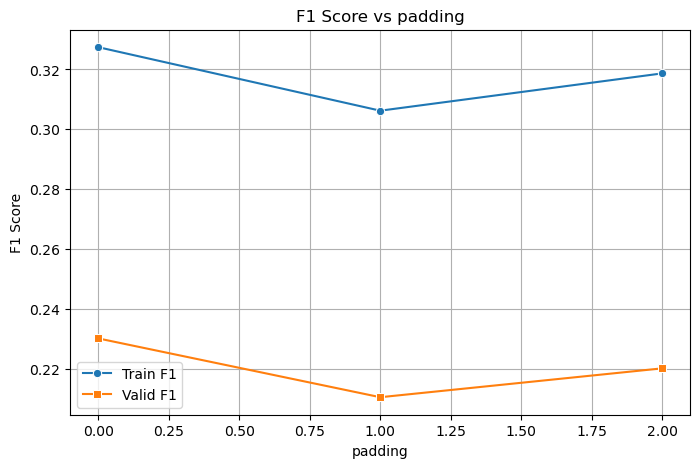

In [61]:
# Plotting
params_to_plot = ['lr', 'dropout', 'conv1_out_channels', 'kernel_size', 'padding']

for param in params_to_plot:
    plt.figure(figsize=(8,5))
    grouped = results_df.groupby(param).mean()
    print(grouped)

    sns.lineplot(x=grouped.index, y=grouped['train_f1'], marker='o', label='Train F1')
    sns.lineplot(x=grouped.index, y=grouped['valid_f1'], marker='s', label='Valid F1')

    plt.title(f'F1 Score vs {param}')
    plt.xlabel(param)
    plt.ylabel('F1 Score')
    plt.legend()
    plt.grid(True)
    plt.show()


In [76]:
import torch.nn as nn
import torch.optim as optim

model = SexismAudioCNNAlexNet(input_dim=X_train.shape[2], max_frames=X_train.shape[1], conv1_out = 64
                              , dropout = 0.3, kernel_size = 2, padding = 2)
criterion = nn.BCELoss()  # Use CrossEntropyLoss for multi-class
optimizer = optim.Adam(model.parameters(), lr=0.00001)


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# For tracking
train_losses, valid_losses, valid_accuracies, train_accuracies = [], [], [], []

from sklearn.metrics import f1_score

for epoch in range(10):  # set num_epochs here
    model.train()
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)

        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        preds = (outputs >= 0.5).float()
        train_correct += (preds == y_batch).sum().item()
        train_total += y_batch.size(0)

    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    train_accuracy = train_correct / train_total

    # Evaluation
    model.eval()
    valid_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    all_preds_prob = []

    with torch.no_grad():
        for X_batch, y_batch in valid_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            valid_loss += loss.item()

            preds = (outputs >= 0.5).float()
            correct += (preds == y_batch).sum().item()
            total += y_batch.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_preds_prob.extend(outputs.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    avg_valid_loss = valid_loss / len(valid_loader)
    accuracy = correct / total
    valid_losses.append(avg_valid_loss)
    valid_accuracies.append(accuracy)
    train_accuracies.append(train_accuracy)

    # Compute F1 macro score
    f1_macro = f1_score(all_labels, all_preds, average='macro')

    print(f"Epoch {epoch+1}: Train Loss = {avg_train_loss:.4f}, Train Acc = {train_accuracy:.4f}, "
          f"Valid Loss = {avg_valid_loss:.4f}, Valid Acc = {accuracy:.4f}, F1 Macro = {f1_macro:.4f}")
    
    
    # Collect train predictions
    model.eval()
    train_preds, train_labels, train_probs = [], [], []

    with torch.no_grad():
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()

            train_preds.extend(preds.cpu().numpy())
            train_probs.extend(outputs.cpu().numpy())
            train_labels.extend(y_batch.cpu().numpy())
            
    # Collect valid predictions
    model.eval()
    valid_preds, valid_labels, valid_probs = [], [], []

    with torch.no_grad():
        for X_batch, y_batch in valid_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()

            valid_preds.extend(preds.cpu().numpy())
            valid_probs.extend(outputs.cpu().numpy())
            valid_labels.extend(y_batch.cpu().numpy())
            
    # Collect test predictions
    model.eval()
    test_preds, test_labels, test_probs = [], [], []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()

            test_preds.extend(preds.cpu().numpy())
            test_probs.extend(outputs.cpu().numpy())
            test_labels.extend(y_batch.cpu().numpy())

Epoch 1: Train Loss = 0.6872, Train Acc = 0.5455, Valid Loss = 0.6874, Valid Acc = 0.5692, F1 Macro = 0.3627
Epoch 2: Train Loss = 0.6839, Train Acc = 0.5420, Valid Loss = 0.6853, Valid Acc = 0.5436, F1 Macro = 0.3622
Epoch 3: Train Loss = 0.6773, Train Acc = 0.5952, Valid Loss = 0.6894, Valid Acc = 0.5385, F1 Macro = 0.5046
Epoch 4: Train Loss = 0.6796, Train Acc = 0.5763, Valid Loss = 0.6897, Valid Acc = 0.5641, F1 Macro = 0.4705
Epoch 5: Train Loss = 0.6826, Train Acc = 0.5866, Valid Loss = 0.6918, Valid Acc = 0.5231, F1 Macro = 0.4802
Epoch 6: Train Loss = 0.6735, Train Acc = 0.5969, Valid Loss = 0.6928, Valid Acc = 0.5282, F1 Macro = 0.4841
Epoch 7: Train Loss = 0.6723, Train Acc = 0.6106, Valid Loss = 0.6949, Valid Acc = 0.5333, F1 Macro = 0.4946
Epoch 8: Train Loss = 0.6710, Train Acc = 0.6038, Valid Loss = 0.6927, Valid Acc = 0.5436, F1 Macro = 0.4618
Epoch 9: Train Loss = 0.6587, Train Acc = 0.6312, Valid Loss = 0.6982, Valid Acc = 0.5128, F1 Macro = 0.4785
Epoch 10: Train Los

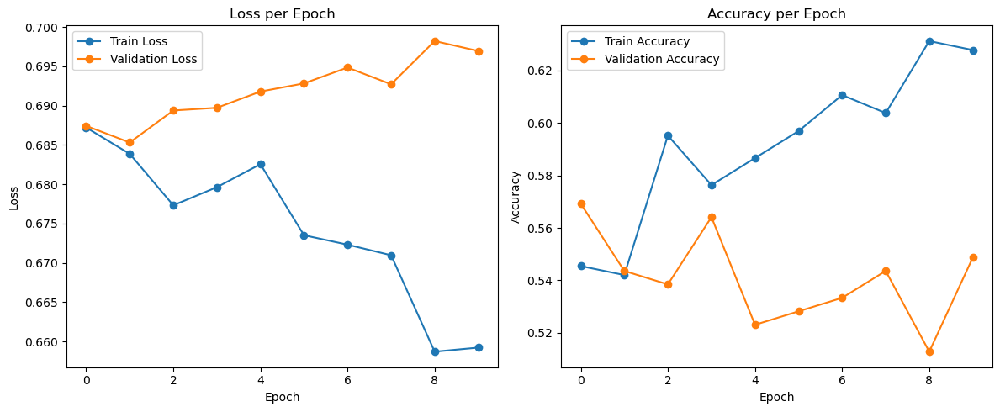

In [78]:
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(valid_losses, label='Validation Loss', marker='o')
plt.title("Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy', marker='o')
plt.plot(valid_accuracies, label='Validation Accuracy', marker='o')
plt.title("Accuracy per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.savefig('Alexnet_loss_accuracy.png')
plt.show()
plt.close()


# Grid Search

In [66]:
from itertools import product
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import f1_score

# Define the grid of hyperparameters
param_grid = {
    'lr': [1e-5, 5e-5, 1e-4, 5e-4, 1e-3],  # more granular learning rates
    'dropout': [0.1, 0.3, 0.4, 0.5, 0.6],  # extended dropout options
    'conv1_out_channels': [32, 64, 128, 256],  # wider range of feature maps
    'kernel_size': [2, 3, 5, 7],  # more receptive field sizes
    'padding': [0, 1, 2, 3]  # to match kernel size variations
}


# Best tracking
best_f1 = 0
best_params = {}
results = []

# CNN model class with tunable conv1 layer
class SexismAudioCNN(nn.Module):
    def __init__(self, input_dim, max_frames, conv1_out, dropout, kernel_size, padding):
        super(SexismAudioCNN, self).__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv1d(in_channels=input_dim, out_channels=conv1_out,
                      kernel_size=kernel_size, padding=padding),
            nn.BatchNorm1d(conv1_out),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2),

            nn.Conv1d(conv1_out, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2),

            nn.Conv1d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.AdaptiveAvgPool1d(1)
        )

        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 128),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

# Loop through combinations of all hyperparameters
for lr, dropout, conv1_out, kernel_size, padding in product(
    param_grid['lr'], param_grid['dropout'],
    param_grid['conv1_out_channels'], param_grid['kernel_size'], param_grid['padding']
):
    print(f"\nTesting configuration: lr={lr}, dropout={dropout}, conv1_out={conv1_out}, "
          f"kernel_size={kernel_size}, padding={padding}")

    # Initialize model with given parameters
    model = SexismAudioCNN(
        input_dim=X_train.shape[2], max_frames=X_train.shape[1],
        conv1_out=conv1_out, dropout=dropout,
        kernel_size=kernel_size, padding=padding
    )
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.BCELoss()

    # Training loop (short for grid search)
    for epoch in range(5):  # You can increase for more reliable comparison
        model.train()
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

    # Evaluation loop
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for X_batch, y_batch in valid_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    f1_macro = f1_score(all_labels, all_preds, average='macro')
    print(f"F1 Macro: {f1_macro:.4f}")

    results.append({
        'lr': lr,
        'dropout': dropout,
        'conv1_out': conv1_out,
        'kernel_size': kernel_size,
        'padding': padding,
        'f1_macro': f1_macro
    })

    if f1_macro > best_f1:
        best_f1 = f1_macro
        best_params = {
            'lr': lr,
            'dropout': dropout,
            'conv1_out': conv1_out,
            'kernel_size': kernel_size,
            'padding': padding
        }

# Report best results
print("\nBest Configuration Found:")
print(best_params)
print(f"Best F1 Macro: {best_f1:.4f}")



Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=0
F1 Macro: 0.5083

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=1
F1 Macro: 0.5100

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=2
F1 Macro: 0.4761

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=3
F1 Macro: 0.5065

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=0
F1 Macro: 0.5149

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=1
F1 Macro: 0.5167

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=2
F1 Macro: 0.4923

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=3
F1 Macro: 0.4878

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=5, padding=0
F1 Macro: 0.5197

Testing configuration: lr=1e-05, dropout=0.1, conv1_out=32, kernel_size=

F1 Macro: 0.4956

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=0
F1 Macro: 0.4588

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=1
F1 Macro: 0.4880

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=2
F1 Macro: 0.4188

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=3
F1 Macro: 0.5115

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=0
F1 Macro: 0.4632

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=1
F1 Macro: 0.5083

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=2
F1 Macro: 0.5106

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=3
F1 Macro: 0.4957

Testing configuration: lr=1e-05, dropout=0.3, conv1_out=64, kernel_size=5, padding=0
F1 Macro: 0.5178

Testing configuration: lr=1e-05, dropout=0.3, conv1_out

F1 Macro: 0.4964

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=0
F1 Macro: 0.5085

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=1
F1 Macro: 0.4936

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=2
F1 Macro: 0.5229

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=3
F1 Macro: 0.4841

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=0
F1 Macro: 0.4995

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=1
F1 Macro: 0.5021

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=2
F1 Macro: 0.5169

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=3
F1 Macro: 0.5062

Testing configuration: lr=1e-05, dropout=0.4, conv1_out=128, kernel_size=5, padding=0
F1 Macro: 0.4993

Testing configuration: lr=1e-05, dropout=0.4, 

F1 Macro: 0.5183

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=0
F1 Macro: 0.5270

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=1
F1 Macro: 0.5041

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=2
F1 Macro: 0.4979

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=3
F1 Macro: 0.4455

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=0
F1 Macro: 0.4705

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=1
F1 Macro: 0.5017

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=2
F1 Macro: 0.4975

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=3
F1 Macro: 0.5100

Testing configuration: lr=1e-05, dropout=0.5, conv1_out=256, kernel_size=5, padding=0
F1 Macro: 0.5041

Testing configuration: lr=1e-05, dropout=0.5, 

F1 Macro: 0.5037

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=0
F1 Macro: 0.5100

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=1
F1 Macro: 0.4835

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=2
F1 Macro: 0.4908

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=2, padding=3
F1 Macro: 0.5197

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=0
F1 Macro: 0.4999

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=1
F1 Macro: 0.4999

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=2
F1 Macro: 0.4882

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=3, padding=3
F1 Macro: 0.4975

Testing configuration: lr=5e-05, dropout=0.1, conv1_out=32, kernel_size=5, padding=0
F1 Macro: 0.5085

Testing configuration: lr=5e-05, dropout=0.1, conv1_out

F1 Macro: 0.5109

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=0
F1 Macro: 0.4991

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=1
F1 Macro: 0.5156

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=2
F1 Macro: 0.4957

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=2, padding=3
F1 Macro: 0.5270

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=0
F1 Macro: 0.4999

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=1
F1 Macro: 0.5128

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=2
F1 Macro: 0.5019

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=3, padding=3
F1 Macro: 0.4991

Testing configuration: lr=5e-05, dropout=0.3, conv1_out=64, kernel_size=5, padding=0
F1 Macro: 0.5043

Testing configuration: lr=5e-05, dropout=0.3, conv1_out

F1 Macro: 0.4906

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=0
F1 Macro: 0.4976

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=1
F1 Macro: 0.4936

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=2
F1 Macro: 0.5167

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=2, padding=3
F1 Macro: 0.5137

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=0
F1 Macro: 0.4956

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=1
F1 Macro: 0.5085

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=2
F1 Macro: 0.5224

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=3, padding=3
F1 Macro: 0.4946

Testing configuration: lr=5e-05, dropout=0.4, conv1_out=128, kernel_size=5, padding=0
F1 Macro: 0.5041

Testing configuration: lr=5e-05, dropout=0.4, 

F1 Macro: 0.4914

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=0
F1 Macro: 0.4914

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=1
F1 Macro: 0.5019

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=2
F1 Macro: 0.4872

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=2, padding=3
F1 Macro: 0.5043

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=0
F1 Macro: 0.4855

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=1
F1 Macro: 0.4814

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=2
F1 Macro: 0.4991

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=3, padding=3
F1 Macro: 0.5037

Testing configuration: lr=5e-05, dropout=0.5, conv1_out=256, kernel_size=5, padding=0
F1 Macro: 0.4993

Testing configuration: lr=5e-05, dropout=0.5, 

F1 Macro: 0.4895

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=2, padding=0
F1 Macro: 0.4936

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=2, padding=1
F1 Macro: 0.4914

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=2, padding=2
F1 Macro: 0.4772

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=2, padding=3
F1 Macro: 0.4614

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=3, padding=0
F1 Macro: 0.4991

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=3, padding=1
F1 Macro: 0.4961

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=3, padding=2
F1 Macro: 0.5209

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=3, padding=3
F1 Macro: 0.5017

Testing configuration: lr=0.0001, dropout=0.1, conv1_out=32, kernel_size=5, padding=0
F1 Macro: 0.4885

Testing configuration: lr=0.0001, dropout=0.1,

F1 Macro: 0.4825

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=32, kernel_size=7, padding=3
F1 Macro: 0.5026

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=2, padding=0
F1 Macro: 0.5105

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=2, padding=1
F1 Macro: 0.4800

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=2, padding=2
F1 Macro: 0.4986

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=2, padding=3
F1 Macro: 0.4991

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=3, padding=0
F1 Macro: 0.4946

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=3, padding=1
F1 Macro: 0.4998

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=3, padding=2
F1 Macro: 0.5077

Testing configuration: lr=0.0001, dropout=0.3, conv1_out=64, kernel_size=3, padding=3
F1 Macro: 0.4870

Testing configuration: lr=0.0001, dropout=0.3,

F1 Macro: 0.5005

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=64, kernel_size=7, padding=2
F1 Macro: 0.5309

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=64, kernel_size=7, padding=3
F1 Macro: 0.5016

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=128, kernel_size=2, padding=0
F1 Macro: 0.5156

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=128, kernel_size=2, padding=1
F1 Macro: 0.5037

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=128, kernel_size=2, padding=2
F1 Macro: 0.4614

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=128, kernel_size=2, padding=3
F1 Macro: 0.5043

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=128, kernel_size=3, padding=0
F1 Macro: 0.4953

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=128, kernel_size=3, padding=1
F1 Macro: 0.5066

Testing configuration: lr=0.0001, dropout=0.4, conv1_out=128, kernel_size=3, padding=2
F1 Macro: 0.5156

Testing configuration: lr=0.0001, dropo

F1 Macro: 0.4921

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=128, kernel_size=7, padding=1
F1 Macro: 0.5102

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=128, kernel_size=7, padding=2
F1 Macro: 0.5017

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=128, kernel_size=7, padding=3
F1 Macro: 0.4914

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=256, kernel_size=2, padding=0
F1 Macro: 0.4764

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=256, kernel_size=2, padding=1
F1 Macro: 0.4950

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=256, kernel_size=2, padding=2
F1 Macro: 0.4950

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=256, kernel_size=2, padding=3
F1 Macro: 0.5168

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=256, kernel_size=3, padding=0
F1 Macro: 0.4964

Testing configuration: lr=0.0001, dropout=0.5, conv1_out=256, kernel_size=3, padding=1
F1 Macro: 0.5037

Testing configuration: lr=0.0001, dro

F1 Macro: 0.4976

Testing configuration: lr=0.0001, dropout=0.6, conv1_out=256, kernel_size=7, padding=0
F1 Macro: 0.4959

Testing configuration: lr=0.0001, dropout=0.6, conv1_out=256, kernel_size=7, padding=1
F1 Macro: 0.5111

Testing configuration: lr=0.0001, dropout=0.6, conv1_out=256, kernel_size=7, padding=2
F1 Macro: 0.4824

Testing configuration: lr=0.0001, dropout=0.6, conv1_out=256, kernel_size=7, padding=3
F1 Macro: 0.4986

Testing configuration: lr=0.0005, dropout=0.1, conv1_out=32, kernel_size=2, padding=0
F1 Macro: 0.4486

Testing configuration: lr=0.0005, dropout=0.1, conv1_out=32, kernel_size=2, padding=1
F1 Macro: 0.4869

Testing configuration: lr=0.0005, dropout=0.1, conv1_out=32, kernel_size=2, padding=2
F1 Macro: 0.4809

Testing configuration: lr=0.0005, dropout=0.1, conv1_out=32, kernel_size=2, padding=3
F1 Macro: 0.5038

Testing configuration: lr=0.0005, dropout=0.1, conv1_out=32, kernel_size=3, padding=0
F1 Macro: 0.4968

Testing configuration: lr=0.0005, dropout=

F1 Macro: 0.4113

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=32, kernel_size=5, padding=3
F1 Macro: 0.5106

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=32, kernel_size=7, padding=0
F1 Macro: 0.3789

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=32, kernel_size=7, padding=1
F1 Macro: 0.5046

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=32, kernel_size=7, padding=2
F1 Macro: 0.4923

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=32, kernel_size=7, padding=3
F1 Macro: 0.4845

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=64, kernel_size=2, padding=0
F1 Macro: 0.3789

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=64, kernel_size=2, padding=1
F1 Macro: 0.5218

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=64, kernel_size=2, padding=2
F1 Macro: 0.5142

Testing configuration: lr=0.0005, dropout=0.3, conv1_out=64, kernel_size=2, padding=3
F1 Macro: 0.4846

Testing configuration: lr=0.0005, dropout=0.3,

F1 Macro: 0.5115

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=64, kernel_size=5, padding=2
F1 Macro: 0.4269

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=64, kernel_size=5, padding=3
F1 Macro: 0.5432

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=64, kernel_size=7, padding=0
F1 Macro: 0.5010

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=64, kernel_size=7, padding=1
F1 Macro: 0.4794

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=64, kernel_size=7, padding=2
F1 Macro: 0.4591

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=64, kernel_size=7, padding=3
F1 Macro: 0.4604

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=128, kernel_size=2, padding=0
F1 Macro: 0.5076

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=128, kernel_size=2, padding=1
F1 Macro: 0.3741

Testing configuration: lr=0.0005, dropout=0.4, conv1_out=128, kernel_size=2, padding=2
F1 Macro: 0.3627

Testing configuration: lr=0.0005, dropout=0

F1 Macro: 0.5085

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=128, kernel_size=5, padding=1
F1 Macro: 0.5197

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=128, kernel_size=5, padding=2
F1 Macro: 0.5151

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=128, kernel_size=5, padding=3
F1 Macro: 0.4990

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=128, kernel_size=7, padding=0
F1 Macro: 0.4253

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=128, kernel_size=7, padding=1
F1 Macro: 0.5491

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=128, kernel_size=7, padding=2
F1 Macro: 0.4334

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=128, kernel_size=7, padding=3
F1 Macro: 0.4961

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=256, kernel_size=2, padding=0
F1 Macro: 0.4953

Testing configuration: lr=0.0005, dropout=0.5, conv1_out=256, kernel_size=2, padding=1
F1 Macro: 0.4722

Testing configuration: lr=0.0005, dro

F1 Macro: 0.4555

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=5, padding=0
F1 Macro: 0.5005

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=5, padding=1
F1 Macro: 0.4722

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=5, padding=2
F1 Macro: 0.4784

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=5, padding=3
F1 Macro: 0.4804

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=7, padding=0
F1 Macro: 0.5037

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=7, padding=1
F1 Macro: 0.4921

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=7, padding=2
F1 Macro: 0.4396

Testing configuration: lr=0.0005, dropout=0.6, conv1_out=256, kernel_size=7, padding=3
F1 Macro: 0.5085

Testing configuration: lr=0.001, dropout=0.1, conv1_out=32, kernel_size=2, padding=0
F1 Macro: 0.5111

Testing configuration: lr=0.001, dropou

F1 Macro: 0.4923

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=5, padding=0
F1 Macro: 0.4396

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=5, padding=1
F1 Macro: 0.4991

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=5, padding=2
F1 Macro: 0.5105

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=5, padding=3
F1 Macro: 0.4923

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=7, padding=0
F1 Macro: 0.4708

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=7, padding=1
F1 Macro: 0.4648

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=7, padding=2
F1 Macro: 0.4775

Testing configuration: lr=0.001, dropout=0.3, conv1_out=32, kernel_size=7, padding=3
F1 Macro: 0.4624

Testing configuration: lr=0.001, dropout=0.3, conv1_out=64, kernel_size=2, padding=0
F1 Macro: 0.4276

Testing configuration: lr=0.001, dropout=0.3, conv1_out

F1 Macro: 0.4910

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=5, padding=0
F1 Macro: 0.5128

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=5, padding=1
F1 Macro: 0.5018

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=5, padding=2
F1 Macro: 0.4841

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=5, padding=3
F1 Macro: 0.5026

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=7, padding=0
F1 Macro: 0.5016

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=7, padding=1
F1 Macro: 0.4770

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=7, padding=2
F1 Macro: 0.4908

Testing configuration: lr=0.001, dropout=0.4, conv1_out=64, kernel_size=7, padding=3
F1 Macro: 0.5169

Testing configuration: lr=0.001, dropout=0.4, conv1_out=128, kernel_size=2, padding=0
F1 Macro: 0.5038

Testing configuration: lr=0.001, dropout=0.4, conv1_ou

F1 Macro: 0.4429

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=5, padding=0
F1 Macro: 0.4113

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=5, padding=1
F1 Macro: 0.4670

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=5, padding=2
F1 Macro: 0.5076

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=5, padding=3
F1 Macro: 0.5191

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=7, padding=0
F1 Macro: 0.5115

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=7, padding=1
F1 Macro: 0.4768

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=7, padding=2
F1 Macro: 0.4750

Testing configuration: lr=0.001, dropout=0.5, conv1_out=128, kernel_size=7, padding=3
F1 Macro: 0.4846

Testing configuration: lr=0.001, dropout=0.5, conv1_out=256, kernel_size=2, padding=0
F1 Macro: 0.4305

Testing configuration: lr=0.001, dropout=0.5, 

F1 Macro: 0.4999

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=5, padding=0
F1 Macro: 0.5137

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=5, padding=1
F1 Macro: 0.4196

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=5, padding=2
F1 Macro: 0.4973

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=5, padding=3
F1 Macro: 0.4986

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=7, padding=0
F1 Macro: 0.4874

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=7, padding=1
F1 Macro: 0.4352

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=7, padding=2
F1 Macro: 0.4601

Testing configuration: lr=0.001, dropout=0.6, conv1_out=256, kernel_size=7, padding=3
F1 Macro: 0.5167

Best Configuration Found:
{'lr': 0.0005, 'dropout': 0.4, 'conv1_out': 128, 'kernel_size': 5, 'padding': 3}
Best F1 Macro: 0.5639


# RNN Grid Search

In [71]:
param_grid = {
    'hidden_dim': [64, 128, 256],
    'num_layers': [1, 2, 3],
    'dropout': [0.2, 0.3, 0.5],
    'lr': [1e-4, 5e-4, 1e-3]
}


In [72]:
import itertools
from sklearn.metrics import f1_score
import numpy as np

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

best_f1 = 0
best_params = None

for params in itertools.product(*param_grid.values()):
    hidden_dim, num_layers, dropout, lr = params
    model = SexismAudioRNN(input_dim=X_train.shape[2], hidden_dim=hidden_dim,
                           num_layers=num_layers, dropout=dropout).to(device)
    
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    
    # Simple training loop for fewer epochs
    for epoch in range(5):  # shorter training for search
        model.train()
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()
    
    # Evaluate
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for X_batch, y_batch in valid_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())
    
    f1_macro = f1_score(all_labels, all_preds, average='macro')
    
    if f1_macro > best_f1:
        best_f1 = f1_macro
        best_params = {
            'hidden_dim': hidden_dim,
            'num_layers': num_layers,
            'dropout': dropout,
            'lr': lr
        }

    print(f"Tested: {params} → F1 macro: {f1_macro:.4f}")

print("\nBest Params:", best_params)
print("Best F1 Macro:", best_f1)


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.2, 0.0001) → F1 macro: 0.4804


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.2, 0.0005) → F1 macro: 0.4493


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.2, 0.001) → F1 macro: 0.4739


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.3, 0.0001) → F1 macro: 0.3948


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.3, 0.0005) → F1 macro: 0.4811


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.3, 0.001) → F1 macro: 0.4885


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.5, 0.0001) → F1 macro: 0.3564


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.5, 0.0005) → F1 macro: 0.4493


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (64, 1, 0.5, 0.001) → F1 macro: 0.4878
Tested: (64, 2, 0.2, 0.0001) → F1 macro: 0.3627
Tested: (64, 2, 0.2, 0.0005) → F1 macro: 0.4489
Tested: (64, 2, 0.2, 0.001) → F1 macro: 0.4834
Tested: (64, 2, 0.3, 0.0001) → F1 macro: 0.3627
Tested: (64, 2, 0.3, 0.0005) → F1 macro: 0.4990
Tested: (64, 2, 0.3, 0.001) → F1 macro: 0.4883
Tested: (64, 2, 0.5, 0.0001) → F1 macro: 0.3627
Tested: (64, 2, 0.5, 0.0005) → F1 macro: 0.4682
Tested: (64, 2, 0.5, 0.001) → F1 macro: 0.4302
Tested: (64, 3, 0.2, 0.0001) → F1 macro: 0.3627
Tested: (64, 3, 0.2, 0.0005) → F1 macro: 0.4513
Tested: (64, 3, 0.2, 0.001) → F1 macro: 0.5057
Tested: (64, 3, 0.3, 0.0001) → F1 macro: 0.3627
Tested: (64, 3, 0.3, 0.0005) → F1 macro: 0.4999
Tested: (64, 3, 0.3, 0.001) → F1 macro: 0.4512
Tested: (64, 3, 0.5, 0.0001) → F1 macro: 0.3059
Tested: (64, 3, 0.5, 0.0005) → F1 macro: 0.4129
Tested: (64, 3, 0.5, 0.001) → F1 macro: 0.4845


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.2, 0.0001) → F1 macro: 0.5115


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.2, 0.0005) → F1 macro: 0.4871


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.2, 0.001) → F1 macro: 0.4767


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.3, 0.0001) → F1 macro: 0.3920


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.3, 0.0005) → F1 macro: 0.4996


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.3, 0.001) → F1 macro: 0.4885


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.5, 0.0001) → F1 macro: 0.4158


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.5, 0.0005) → F1 macro: 0.4715


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (128, 1, 0.5, 0.001) → F1 macro: 0.4883
Tested: (128, 2, 0.2, 0.0001) → F1 macro: 0.3607
Tested: (128, 2, 0.2, 0.0005) → F1 macro: 0.4883
Tested: (128, 2, 0.2, 0.001) → F1 macro: 0.4885
Tested: (128, 2, 0.3, 0.0001) → F1 macro: 0.3765
Tested: (128, 2, 0.3, 0.0005) → F1 macro: 0.4767
Tested: (128, 2, 0.3, 0.001) → F1 macro: 0.4959
Tested: (128, 2, 0.5, 0.0001) → F1 macro: 0.3607
Tested: (128, 2, 0.5, 0.0005) → F1 macro: 0.5072
Tested: (128, 2, 0.5, 0.001) → F1 macro: 0.4583
Tested: (128, 3, 0.2, 0.0001) → F1 macro: 0.3627
Tested: (128, 3, 0.2, 0.0005) → F1 macro: 0.4583
Tested: (128, 3, 0.2, 0.001) → F1 macro: 0.4961
Tested: (128, 3, 0.3, 0.0001) → F1 macro: 0.3627
Tested: (128, 3, 0.3, 0.0005) → F1 macro: 0.4770
Tested: (128, 3, 0.3, 0.001) → F1 macro: 0.4512
Tested: (128, 3, 0.5, 0.0001) → F1 macro: 0.3627
Tested: (128, 3, 0.5, 0.0005) → F1 macro: 0.4724
Tested: (128, 3, 0.5, 0.001) → F1 macro: 0.4715


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.2, 0.0001) → F1 macro: 0.3837


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.2, 0.0005) → F1 macro: 0.4715


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.2, 0.001) → F1 macro: 0.5065


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.3, 0.0001) → F1 macro: 0.3692


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.3, 0.0005) → F1 macro: 0.4752


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.3 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.3, 0.001) → F1 macro: 0.4775


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.5, 0.0001) → F1 macro: 0.4321


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.5, 0.0005) → F1 macro: 0.4797


/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.5 and num_layers=1
  warnings.warn(


Tested: (256, 1, 0.5, 0.001) → F1 macro: 0.4996
Tested: (256, 2, 0.2, 0.0001) → F1 macro: 0.3735
Tested: (256, 2, 0.2, 0.0005) → F1 macro: 0.4797
Tested: (256, 2, 0.2, 0.001) → F1 macro: 0.4478
Tested: (256, 2, 0.3, 0.0001) → F1 macro: 0.3690
Tested: (256, 2, 0.3, 0.0005) → F1 macro: 0.4478
Tested: (256, 2, 0.3, 0.001) → F1 macro: 0.4269
Tested: (256, 2, 0.5, 0.0001) → F1 macro: 0.3607
Tested: (256, 2, 0.5, 0.0005) → F1 macro: 0.4878
Tested: (256, 2, 0.5, 0.001) → F1 macro: 0.4959
Tested: (256, 3, 0.2, 0.0001) → F1 macro: 0.3717
Tested: (256, 3, 0.2, 0.0005) → F1 macro: 0.4687
Tested: (256, 3, 0.2, 0.001) → F1 macro: 0.5168
Tested: (256, 3, 0.3, 0.0001) → F1 macro: 0.3586
Tested: (256, 3, 0.3, 0.0005) → F1 macro: 0.4632
Tested: (256, 3, 0.3, 0.001) → F1 macro: 0.3627
Tested: (256, 3, 0.5, 0.0001) → F1 macro: 0.3627
Tested: (256, 3, 0.5, 0.0005) → F1 macro: 0.4770
Tested: (256, 3, 0.5, 0.001) → F1 macro: 0.4797

Best Params: {'hidden_dim': 256, 'num_layers': 3, 'dropout': 0.2, 'lr': 0.0

In [31]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# {'lr': 0.0005, 'dropout': 0.4, 'conv1_out': 128, 'kernel_size': 5, 'padding': 3}

# class SexismAudioCNN(nn.Module):
#     def __init__(self, input_dim, max_frames, conv1_out, dropout, kernel_size, padding):
#         super(SexismAudioCNN, self).__init__()

#         self.conv_layers = nn.Sequential(
#             nn.Conv1d(in_channels=input_dim, out_channels=conv1_out,
#                       kernel_size=kernel_size, padding=padding),
#             nn.BatchNorm1d(conv1_out),
#             nn.ReLU(),
#             nn.MaxPool1d(kernel_size=2),

#             nn.Conv1d(conv1_out, 256, kernel_size=3, padding=1),
#             nn.BatchNorm1d(256),
#             nn.ReLU(),
#             nn.MaxPool1d(kernel_size=2),

#             nn.Conv1d(256, 512, kernel_size=3, padding=1),
#             nn.BatchNorm1d(512),
#             nn.ReLU(),
#             nn.AdaptiveAvgPool1d(1)
#         )

#         self.fc_layers = nn.Sequential(
#             nn.Flatten(),
#             nn.Linear(512, 128),
#             nn.ReLU(),
#             nn.Dropout(dropout),
#             nn.Linear(128, 1),
#             nn.Sigmoid()
#         )

#     def forward(self, x):
#         x = x.permute(0, 2, 1)
#         x = self.conv_layers(x)
#         x = self.fc_layers(x)
#         return x

class SexismAudioCNN(nn.Module):
    def __init__(self, input_dim, max_frames, conv1_out, dropout, kernel_size, padding):
        super(SexismAudioCNN, self).__init__()

        self.conv_layers = nn.Sequential(
            # First convolutional layer
            nn.Conv1d(in_channels=input_dim, out_channels=conv1_out,
                      kernel_size=kernel_size, padding=padding),
            nn.BatchNorm1d(conv1_out),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2),

            # Second convolutional layer
            nn.Conv1d(conv1_out, 256, kernel_size=3, padding=1),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size=2),

            # Adaptive pooling to reduce dimensions
            nn.AdaptiveAvgPool1d(1)
        )

        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 128),  # Adjusted input size from 512 to 256
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = x.permute(0, 2, 1)
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x


In [32]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torch
import torch.nn as nn

class SexismAudioRNN(nn.Module):
    def __init__(self, input_dim, hidden_dim=128, num_layers=2, dropout=0.3):
        super(SexismAudioRNN, self).__init__()
        
        self.hidden_dim = hidden_dim
        
        # Unidirectional LSTM layer
        self.rnn = nn.LSTM(
            input_size=input_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            dropout=dropout,
            batch_first=True,
            bidirectional=False
        )
        
        # Fully connected layers
        self.fc = nn.Sequential(
            nn.Linear(hidden_dim, 128),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # x shape: (batch, time, features)
        out, _ = self.rnn(x)  # out: (batch, time, hidden_dim)

        # Use the last timestep's output
        last_out = out[:, -1, :]  # (batch, hidden_dim)

        return self.fc(last_out)


In [42]:
import torch.nn as nn
import torch.optim as optim

model = SexismAudioCNN(input_dim=X_train.shape[2], max_frames=X_train.shape[1], conv1_out = 64
                       , dropout = 0.3, kernel_size = 2, padding = 1 )
# model = SexismAudioRNN(input_dim=X_train.shape[2], hidden_dim=64, num_layers=2, dropout=0.3)
criterion = nn.BCELoss()  # Use CrossEntropyLoss for multi-class
optimizer = optim.Adam(model.parameters(), lr=0.00001)
# optimizer = optim.Adam(model.parameters(), lr=0.0001)
# optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=1e-4)


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# For tracking
train_losses, valid_losses, valid_accuracies, train_accuracies = [], [], [], []

from sklearn.metrics import f1_score

for epoch in range(16):  # set num_epochs here
    model.train()
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)

        optimizer.zero_grad()
        outputs = model(X_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

        preds = (outputs >= 0.5).float()
        train_correct += (preds == y_batch).sum().item()
        train_total += y_batch.size(0)

    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    train_accuracy = train_correct / train_total

    # Evaluation
    model.eval()
    valid_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    all_preds_prob = []

    with torch.no_grad():
        for X_batch, y_batch in valid_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            valid_loss += loss.item()

            preds = (outputs >= 0.5).float()
            correct += (preds == y_batch).sum().item()
            total += y_batch.size(0)

            all_preds.extend(preds.cpu().numpy())
            all_preds_prob.extend(outputs.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

    avg_valid_loss = valid_loss / len(valid_loader)
    accuracy = correct / total
    valid_losses.append(avg_valid_loss)
    valid_accuracies.append(accuracy)
    train_accuracies.append(train_accuracy)

    # Compute F1 macro score
    f1_macro = f1_score(all_labels, all_preds, average='macro')

    print(f"Epoch {epoch+1}: Train Loss = {avg_train_loss:.4f}, Train Acc = {train_accuracy:.4f}, "
          f"Valid Loss = {avg_valid_loss:.4f}, Valid Acc = {accuracy:.4f}, F1 Macro = {f1_macro:.4f}")
    
    
    # Collect train predictions
    model.eval()
    train_preds, train_labels, train_probs = [], [], []

    with torch.no_grad():
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()

            train_preds.extend(preds.cpu().numpy())
            train_probs.extend(outputs.cpu().numpy())
            train_labels.extend(y_batch.cpu().numpy())
            
    # Collect valid predictions
    model.eval()
    valid_preds, valid_labels, valid_probs = [], [], []

    with torch.no_grad():
        for X_batch, y_batch in valid_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()

            valid_preds.extend(preds.cpu().numpy())
            valid_probs.extend(outputs.cpu().numpy())
            valid_labels.extend(y_batch.cpu().numpy())
            
    # Collect test predictions
    model.eval()
    test_preds, test_labels, test_probs = [], [], []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device).unsqueeze(1)
            outputs = model(X_batch)
            preds = (outputs >= 0.5).float()

            test_preds.extend(preds.cpu().numpy())
            test_probs.extend(outputs.cpu().numpy())
            test_labels.extend(y_batch.cpu().numpy())

Epoch 1: Train Loss = 0.6886, Train Acc = 0.5626, Valid Loss = 0.6899, Valid Acc = 0.5487, F1 Macro = 0.4231
Epoch 2: Train Loss = 0.6896, Train Acc = 0.5386, Valid Loss = 0.6895, Valid Acc = 0.5282, F1 Macro = 0.4411
Epoch 3: Train Loss = 0.6854, Train Acc = 0.5952, Valid Loss = 0.6888, Valid Acc = 0.5385, F1 Macro = 0.4478
Epoch 4: Train Loss = 0.6869, Train Acc = 0.5780, Valid Loss = 0.6881, Valid Acc = 0.5333, F1 Macro = 0.4389
Epoch 5: Train Loss = 0.6849, Train Acc = 0.5506, Valid Loss = 0.6876, Valid Acc = 0.5385, F1 Macro = 0.4422
Epoch 6: Train Loss = 0.6851, Train Acc = 0.5592, Valid Loss = 0.6873, Valid Acc = 0.5282, F1 Macro = 0.4356
Epoch 7: Train Loss = 0.6849, Train Acc = 0.5849, Valid Loss = 0.6869, Valid Acc = 0.5538, F1 Macro = 0.4522
Epoch 8: Train Loss = 0.6845, Train Acc = 0.5626, Valid Loss = 0.6868, Valid Acc = 0.5333, F1 Macro = 0.4389
Epoch 9: Train Loss = 0.6820, Train Acc = 0.5883, Valid Loss = 0.6862, Valid Acc = 0.5538, F1 Macro = 0.4397
Epoch 10: Train Los

In [43]:
from sklearn.metrics import accuracy_score, f1_score

# Flatten arrays to 1D
test_preds_flat = [int(p[0]) for p in test_preds]
test_labels_flat = [int(l[0]) for l in test_labels]

# Accuracy and F1 Macro Score
test_acc = accuracy_score(test_labels_flat, test_preds_flat)
test_f1 = f1_score(test_labels_flat, test_preds_flat, average='macro')

print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test F1 Macro Score: {test_f1:.4f}")


Test Accuracy: 0.5641
Test F1 Macro Score: 0.5218


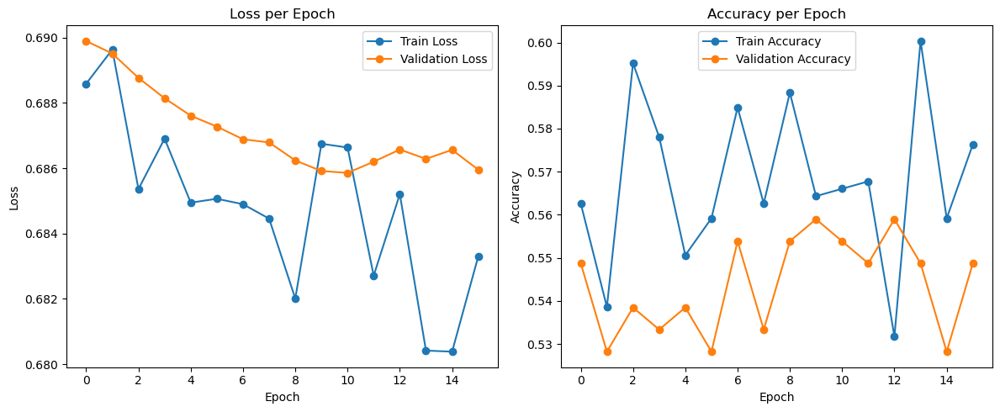

In [44]:
plt.figure(figsize=(12, 5))

# Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(valid_losses, label='Validation Loss', marker='o')
plt.title("Loss per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy', marker='o')
plt.plot(valid_accuracies, label='Validation Accuracy', marker='o')
plt.title("Accuracy per Epoch")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
# plt.savefig('cnn_best_params.png')
plt.show()
plt.close()





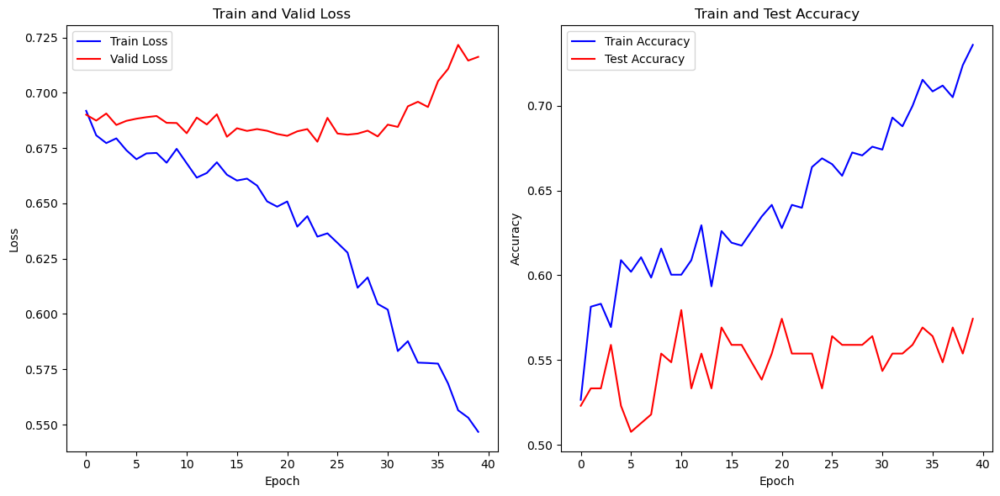

In [75]:
import matplotlib.pyplot as plt

# Create the subplots
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot for train and test loss
ax[0].plot(train_losses, label='Train Loss', color='blue')
ax[0].plot(valid_losses, label='Valid Loss', color='red')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].set_title("Train and Valid Loss")
ax[0].legend()

# Plot for train and test accuracy
ax[1].plot(train_accuracies, label='Train Accuracy', color='blue')
ax[1].plot(valid_accuracies, label='Test Accuracy', color='red')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Accuracy')
ax[1].set_title("Train and Test Accuracy")
ax[1].legend()

# Show the plot
plt.tight_layout()
plt.show()


In [79]:
print(f"Train Prob Length: {len(train_probs)} | Valid Prob Length: {len(valid_probs)} | all_preds_prob Length: {len(all_preds_prob)}")

Train Prob Length: 583 | Valid Prob Length: 195 | all_preds_prob Length: 195


In [80]:
train_df["predicted_probs"] = [float(x[0]) for x in train_probs]
valid_df["predicted_probs"] = [float(x[0]) for x in valid_probs]
test_df["predicted_probs"] = [float(x[0]) for x in test_probs]

In [81]:
full_df = pd.concat([train_df, valid_df, test_df], axis=0).reset_index(drop=True)
full_df.drop(columns=['text'], inplace=True)
full_df.to_csv("audio_probs.csv", index=False)

# Wav2Vec HF

In [51]:
train_df["audio_path"] = train_df["path_video"].apply(
    lambda x: f"/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/training/audio/{x.split('/')[-1].replace('.mp4', '.wav')}"
)

test_df["audio_path"] = test_df["path_video"].apply(
    lambda x: f"/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/training/audio/{x.split('/')[-1].replace('.mp4', '.wav')}"
)

In [52]:
from datasets import Dataset, DatasetDict

# Convert DataFrames to Hugging Face Datasets
train_dataset = Dataset.from_pandas(train_df)
eval_dataset = Dataset.from_pandas(test_df)

# Optionally wrap them in a DatasetDict
dataset = DatasetDict({
    "train": train_dataset,
    "validation": eval_dataset,
})

print(dataset["train"])
print(dataset["validation"])

Dataset({
    features: ['text', 'path_video', 'target', 'audio_path'],
    num_rows: 778
})
Dataset({
    features: ['text', 'path_video', 'target', 'predicted_prob', 'audio_path'],
    num_rows: 195
})


In [53]:
# We need to specify the input and output column
input_column = "audio_path"
output_column = "target"

In [54]:
# we need to distinguish the unique labels in our SER dataset
label_list = train_dataset.unique(output_column)
label_list.sort()  # Let's sort it for determinism
num_labels = len(label_list)
print(f"A classification problem with {num_labels} classes: {label_list}")

A classification problem with 2 classes: [0, 1]


In [55]:
from transformers import AutoConfig, Wav2Vec2Processor

In [56]:
model_name_or_path = "lighteternal/wav2vec2-large-xlsr-53-greek"
pooling_mode = "mean"

In [57]:
# config
config = AutoConfig.from_pretrained(
    model_name_or_path,
    num_labels=num_labels,
    label2id={label: i for i, label in enumerate(label_list)},
    id2label={i: label for i, label in enumerate(label_list)},
    finetuning_task="wav2vec2_clf",
)
setattr(config, 'pooling_mode', pooling_mode)

/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/transformers/configuration_utils.py:311: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(


In [58]:
processor = Wav2Vec2Processor.from_pretrained(model_name_or_path,)
target_sampling_rate = processor.feature_extractor.sampling_rate
print(f"The target sampling rate: {target_sampling_rate}")

The target sampling rate: 16000


In [59]:
import torchaudio
import librosa
import IPython.display as ipd
import numpy as np

In [60]:
def speech_file_to_array_fn(path):
    speech_array, sampling_rate = torchaudio.load(path)
    resampler = torchaudio.transforms.Resample(sampling_rate, target_sampling_rate)
    speech = resampler(speech_array).squeeze().numpy()
    return speech

def label_to_id(label, label_list):

    if len(label_list) > 0:
        return label_list.index(label) if label in label_list else -1

    return label

def preprocess_function(examples):
    speech_list = [speech_file_to_array_fn(path) for path in examples[input_column]]
    target_list = [label_to_id(label, label_list) for label in examples[output_column]]

    result = processor(speech_list, sampling_rate=target_sampling_rate)
    result["labels"] = list(target_list)

    return result

In [61]:
train_dataset = train_dataset.map(
    preprocess_function,
    batch_size=100,
    batched=True,
    num_proc=4
)
eval_dataset = eval_dataset.map(
    preprocess_function,
    batch_size=100,
    batched=True,
    num_proc=4
)

Map (num_proc=4):   0%|          | 0/778 [07:44<?, ? examples/s]


TimeoutError: 

In [ ]:
from dataclasses import dataclass
from typing import Optional, Tuple
import torch
from transformers.file_utils import ModelOutput


@dataclass
class SpeechClassifierOutput(ModelOutput):
    loss: Optional[torch.FloatTensor] = None
    logits: torch.FloatTensor = None
    hidden_states: Optional[Tuple[torch.FloatTensor]] = None
    attentions: Optional[Tuple[torch.FloatTensor]] = None


In [ ]:
import torch
import torch.nn as nn
from torch.nn import BCEWithLogitsLoss, CrossEntropyLoss, MSELoss

from transformers.models.wav2vec2.modeling_wav2vec2 import (
    Wav2Vec2PreTrainedModel,
    Wav2Vec2Model
)


class Wav2Vec2ClassificationHead(nn.Module):
    """Head for wav2vec classification task."""

    def __init__(self, config):
        super().__init__()
        self.dense = nn.Linear(config.hidden_size, config.hidden_size)
        self.dropout = nn.Dropout(config.final_dropout)
        self.out_proj = nn.Linear(config.hidden_size, config.num_labels)

    def forward(self, features, **kwargs):
        x = features
        x = self.dropout(x)
        x = self.dense(x)
        x = torch.tanh(x)
        x = self.dropout(x)
        x = self.out_proj(x)
        return x


class Wav2Vec2ForSpeechClassification(Wav2Vec2PreTrainedModel):
    def __init__(self, config):
        super().__init__(config)
        self.num_labels = config.num_labels
        self.pooling_mode = config.pooling_mode
        self.config = config

        self.wav2vec2 = Wav2Vec2Model(config)
        self.classifier = Wav2Vec2ClassificationHead(config)

        self.init_weights()

    def freeze_feature_extractor(self):
        self.wav2vec2.feature_extractor._freeze_parameters()

    def merged_strategy(
            self,
            hidden_states,
            mode="mean"
    ):
        if mode == "mean":
            outputs = torch.mean(hidden_states, dim=1)
        elif mode == "sum":
            outputs = torch.sum(hidden_states, dim=1)
        elif mode == "max":
            outputs = torch.max(hidden_states, dim=1)[0]
        else:
            raise Exception(
                "The pooling method hasn't been defined! Your pooling mode must be one of these ['mean', 'sum', 'max']")

        return outputs

    def forward(
            self,
            input_values,
            attention_mask=None,
            output_attentions=None,
            output_hidden_states=None,
            return_dict=None,
            labels=None,
    ):
        return_dict = return_dict if return_dict is not None else self.config.use_return_dict
        outputs = self.wav2vec2(
            input_values,
            attention_mask=attention_mask,
            output_attentions=output_attentions,
            output_hidden_states=output_hidden_states,
            return_dict=return_dict,
        )
        hidden_states = outputs[0]
        hidden_states = self.merged_strategy(hidden_states, mode=self.pooling_mode)
        logits = self.classifier(hidden_states)

        loss = None
        if labels is not None:
            if self.config.problem_type is None:
                if self.num_labels == 1:
                    self.config.problem_type = "regression"
                elif self.num_labels > 1 and (labels.dtype == torch.long or labels.dtype == torch.int):
                    self.config.problem_type = "single_label_classification"
                else:
                    self.config.problem_type = "multi_label_classification"

            if self.config.problem_type == "regression":
                loss_fct = MSELoss()
                loss = loss_fct(logits.view(-1, self.num_labels), labels)
            elif self.config.problem_type == "single_label_classification":
                loss_fct = CrossEntropyLoss()
                loss = loss_fct(logits.view(-1, self.num_labels), labels.view(-1))
            elif self.config.problem_type == "multi_label_classification":
                loss_fct = BCEWithLogitsLoss()
                loss = loss_fct(logits, labels)

        if not return_dict:
            output = (logits,) + outputs[2:]
            return ((loss,) + output) if loss is not None else output

        return SpeechClassifierOutput(
            loss=loss,
            logits=logits,
            hidden_states=outputs.hidden_states,
            attentions=outputs.attentions,
        )


# Wav2Vec

In [64]:
import os
import torch
import pandas as pd
import torchaudio
import evaluate
from sklearn.metrics import accuracy_score, f1_score
from transformers import (
    Wav2Vec2ForSequenceClassification,
    Wav2Vec2Processor,
    Trainer,
    TrainingArguments
)
from torch.utils.data import Dataset

/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [65]:
from transformers import Wav2Vec2FeatureExtractor, Wav2Vec2ForSequenceClassification

# Load feature extractor and model
model_name = "facebook/wav2vec2-base"
processor = Wav2Vec2FeatureExtractor.from_pretrained(model_name)

model = Wav2Vec2ForSequenceClassification.from_pretrained(
    model_name,
    num_labels=2  # Assuming binary classification (sexism vs not)
)

/storage/home/hcoda1/6/sali363/.conda/envs/exist2025/lib/python3.12/site-packages/transformers/configuration_utils.py:311: UserWarning: Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 Transformers. Using `model.gradient_checkpointing_enable()` instead, or if you are using the `Trainer` API, pass `gradient_checkpointing=True` in your `TrainingArguments`.
  warnings.warn(
Some weights of Wav2Vec2ForSequenceClassification were not initialized from the model checkpoint at facebook/wav2vec2-base and are newly initialized: ['classifier.bias', 'classifier.weight', 'projector.bias', 'projector.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [66]:
# Load and preprocess audio
def load_audio(file_path):
    waveform, sample_rate = torchaudio.load(file_path)
    if sample_rate != 16000:
        resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
        waveform = resampler(waveform)
    return waveform.squeeze()

In [67]:
# Dataset class
class SexismAudioDataset(Dataset):
    def __init__(self, df, audio_dir, processor):
        self.data = df
        self.audio_dir = audio_dir
        self.processor = processor

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        video_path = os.path.join(self.audio_dir, row['path_video'])
        filename = video_path.split('/')[-1].replace('.mp4', '')
        file_path = f'/storage/home/hcoda1/6/sali363/p-dsgt_clef2025-0/shared/exist/latest/EXIST_2025_Videos_Dataset/training/audio/{filename}.wav'
        waveform = load_audio(file_path)
#         inputs = self.processor(waveform, sampling_rate=16000, return_tensors="pt", padding=True)
        inputs = self.processor(
            waveform,
            sampling_rate=16000,
            return_tensors="pt",
            padding="max_length",
            max_length=16000 * 5,  # For example, 5 seconds of audio
            truncation=True
        )
        input_values = inputs.input_values[0]
        attention_mask = inputs.attention_mask[0]
        label = 1 if row['label'] == 'sexist' else 0
        return {
            "input_values": input_values,
            "attention_mask": attention_mask,
            "labels": torch.tensor(label)
        }

In [68]:
# Load datasets
train_dataset = SexismAudioDataset(train_df, "audio", processor)
val_dataset = SexismAudioDataset(test_df, "audio", processor)

In [69]:
# Metrics
def compute_metrics(pred):
    logits = pred.predictions
    preds = torch.argmax(torch.tensor(logits), dim=-1).numpy()
    labels = pred.label_ids
    acc = accuracy_score(labels, preds)
    f1 = f1_score(labels, preds, average="macro")
    return {"accuracy": acc, "f1_macro": f1}

In [ ]:
import evaluate
import torch
from sklearn.metrics import accuracy_score, f1_score

# Load metrics from the evaluate package
accuracy_metric = evaluate.load("accuracy")
f1_metric = evaluate.load("f1")

# Define compute_metrics using evaluate
def compute_metrics(pred):
    logits = pred.predictions
    preds = torch.argmax(torch.tensor(logits), dim=-1).numpy()
    labels = pred.label_ids

    acc = accuracy_metric.compute(predictions=preds, references=labels)["accuracy"]
    f1 = f1_metric.compute(predictions=preds, references=labels, average="macro")["f1"]

    return {"accuracy": acc, "f1_macro": f1}

# Training arguments
# Older compatible TrainingArguments
training_args = TrainingArguments(
    output_dir="./results",
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    num_train_epochs=3,
    learning_rate=2e-5,
)

# Trainer setup
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=processor,  # or processor if you're using that
    compute_metrics=compute_metrics
)

# Train the model
trainer.train()


/tmp/ipykernel_2617847/2890639807.py:31: FutureWarning: `tokenizer` is deprecated and will be removed in version 5.0.0 for `Trainer.__init__`. Use `processing_class` instead.
  trainer = Trainer(


In [ ]:
# Final performance
train_metrics = trainer.evaluate(eval_dataset=train_dataset)
val_metrics = trainer.evaluate(eval_dataset=val_dataset)

print("Train metrics:", train_metrics)
print("Validation metrics:", val_metrics)
